<h1>Fashine Mnist Project 

#download data

using Kaggle API to download the data into Colab

In [ ]:
!pip install kaggle
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))
  
# Then move kaggle.json into the folder where the API expects to find it.
!mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json
User uploaded file "kaggle.json" with length 70 bytes


In [ ]:
!kaggle datasets download -d zalando-research/fashionmnist

 92% 63.0M/68.8M [00:00<00:00, 222MB/s]
100% 68.8M/68.8M [00:00<00:00, 194MB/s]


In [ ]:
! unzip fashionmnist.zip

Archive:  fashionmnist.zip
  inflating: fashion-mnist_test.csv  
  inflating: fashion-mnist_train.csv  
  inflating: t10k-images-idx3-ubyte  
  inflating: t10k-labels-idx1-ubyte  
  inflating: train-images-idx3-ubyte  
  inflating: train-labels-idx1-ubyte  


#Import Libraries

In [ ]:
#Import important libraries
# import keras
from tensorflow import keras
from keras import Model
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from keras.models import load_model
# from keras.optimizers import Adam
from tensorflow.keras.optimizers import Adam
from keras.utils.vis_utils import plot_model
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import Input, Conv2D, Conv2DTranspose, MaxPooling2D, concatenate, Dropout,BatchNormalization
from keras.layers import Conv2D, Concatenate, MaxPooling2D
from keras.layers import UpSampling2D, Dropout, BatchNormalization
from tqdm import tqdm_notebook
from keras import initializers
from keras import regularizers
from keras import constraints
from keras.layers.convolutional import Conv2D, UpSampling2D, Conv2DTranspose
from keras.layers.core import Activation, SpatialDropout2D
from keras.layers.merge import concatenate,add
# from keras.layers.normalization import BatchNormalization
from tensorflow.keras.layers import BatchNormalization
from keras.layers.pooling import MaxPooling2D
from keras.layers import Input,Dropout,BatchNormalization,Activation,Add ,Flatten ,Dense
# from keras.utils import to_categorical
from tensorflow.keras.utils import to_categorical
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

print(tf.__version__)

2.8.0


#Load Data

In [ ]:
#reading the training and testing data
train_data = pd.read_csv('fashion-mnist_train.csv')
test_data = pd.read_csv('fashion-mnist_test.csv')

In [ ]:
train_data.shape #(60,000*785)
test_data.shape #(10000,785)
train_X= np.array(train_data.iloc[:,1:])
test_X= np.array(test_data.iloc[:,1:])
train_Y= np.array (train_data.iloc[:,0]) # (60000,)
test_Y = np.array(test_data.iloc[:,0]) #(10000,)

In [ ]:
#display some rows of the training data
train_data.head()

,label,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,6,0,0,0,0,0,0,0,5,0,...,0,0,0,30,43,0,0,0,0,0
3,0,0,0,0,1,2,0,0,0,0,...,3,0,0,0,0,1,0,0,0,0
4,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
#display the shape of train and test data
train_X.shape, test_X.shape

((60000, 784), (10000, 784))

#<h1>Preperation and Preprocessing Data

In [ ]:
# Convert the images into 3 channels to fit in input for transfer models
train_X=np.dstack([train_X] * 3)
test_X=np.dstack([test_X]*3)
train_X.shape,test_X.shape

((60000, 784, 3), (10000, 784, 3))

In [ ]:
# Reshape images as per the tensor format required by tensorflow
train_X = train_X.reshape(-1, 28,28,3)
test_X= test_X.reshape (-1,28,28,3)
train_X.shape,test_X.shape

((60000, 28, 28, 3), (10000, 28, 28, 3))

In [ ]:
# Resize the images 48*48 as required by transfer learning 
from keras.preprocessing.image import img_to_array, array_to_img
train_X = np.asarray([img_to_array(array_to_img(im, scale=False).resize((48,48))) for im in train_X])
test_X = np.asarray([img_to_array(array_to_img(im, scale=False).resize((48,48))) for im in test_X])
train_X.shape, test_X.shape

((60000, 48, 48, 3), (10000, 48, 48, 3))

In [ ]:
#specify Labels
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

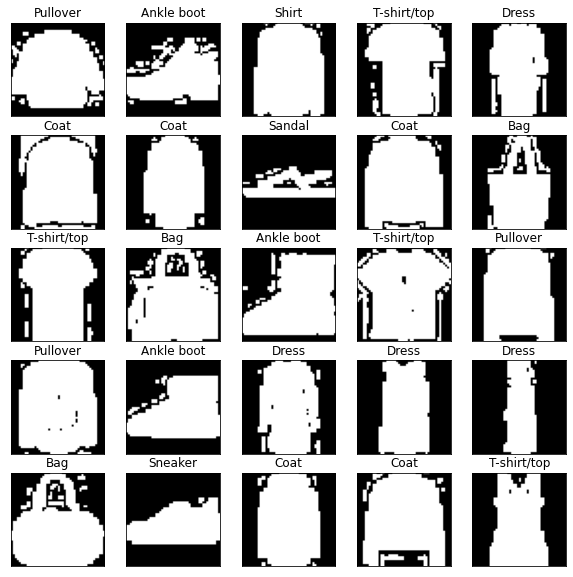

In [ ]:
#display some of images
plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.title(class_names[train_Y[i]])
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])    
    plt.imshow(train_X[i])
plt.show()

##<h1>Normalization for data

In [ ]:
# Normalize the data and change data type from [0, 255] to [0, 1]
train_X = train_X / 255.
test_X = test_X / 255.


<h1> Convert labels to one-hot encoder (To Categorical)

In [ ]:
train_Y_one_hot = to_categorical(train_Y)
test_Y_one_hot = to_categorical(test_Y)

In [ ]:
print(train_Y_one_hot)
print(test_Y_one_hot)

[[0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 1. 0. 0.]]
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 1. 0.]
 [0. 1. 0. ... 0. 0. 0.]]


<h1>Splitting train data as train and validation data

In [ ]:
train_X,valid_X,train_label,valid_label = train_test_split(train_X, train_Y_one_hot, test_size=0.05, random_state=13)

#<h1>Build Models 

##<h1>Import Transfer learning Models (Pre-training models)

In [ ]:
imageSize=train_X[0].shape[0]
Channels=3
print("imageSize : ",imageSize)

imageSize :  48


In [ ]:
# DenseNet169
from tensorflow.keras.applications import DenseNet169
preTrainedModelDenseNet169 = DenseNet169(input_shape = (imageSize, imageSize, Channels), include_top = False, weights='imagenet')

DenseNet169layers = preTrainedModelDenseNet169.layers
print("Number of layer DenseNet169 : ",len(DenseNet169layers))

51888128/51877672 [==============================] - 0s 0us/step
Number of layer DenseNet169 :  595


In [ ]:
for layer  in range(len(DenseNet169layers)-250):
    DenseNet169layers[layer].trainable = False 

preTrainedModelDenseNet169.summary()

Model: "densenet169"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 48, 48, 3)]  0           []                               
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 54, 54, 3)   0           ['input_1[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (None, 24, 24, 64)   9408        ['zero_padding2d[0][0]']         
                                                                                                  
 conv1/bn (BatchNormalization)  (None, 24, 24, 64)   256         ['conv1/conv[0][0]']             
                                                                                        

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.497911 to fit



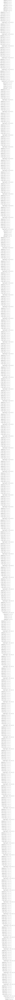

In [ ]:
tf.keras.utils.plot_model(preTrainedModelDenseNet169, show_shapes=True)

In [ ]:
# ResNet152 V2 
from tensorflow.keras.applications import ResNet152V2
preTrainedModelResNet152V2  = ResNet152V2 (input_shape = (imageSize, imageSize, Channels), include_top = False, weights="imagenet")


ResNet152V2layers=preTrainedModelResNet152V2.layers
print("Number of layer ResNet152V2 : ",len(ResNet152V2layers))

234561536/234545216 [==============================] - 3s 0us/step
Number of layer ResNet152V2 :  564


In [ ]:
for layer  in range(len(ResNet152V2layers)-64): 
    ResNet152V2layers[layer].trainable = False 
    
preTrainedModelResNet152V2.summary()

Model: "resnet152v2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 48, 48, 3)]  0           []                               
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 54, 54, 3)    0           ['input_2[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 24, 24, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 pool1_pad (ZeroPadding2D)      (None, 26, 26, 64)   0           ['conv1_conv[0][0]']             
                                                                                        

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.531897 to fit



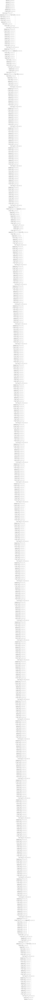

In [ ]:
tf.keras.utils.plot_model(preTrainedModelResNet152V2, show_shapes=True)

In [ ]:
# VGG-16
from tensorflow.keras.applications.vgg16  import VGG16
preTrainedModelVgg16 = VGG16(input_shape = (imageSize, imageSize, Channels), include_top = False, weights='imagenet')

VGG16layers=preTrainedModelVgg16.layers
print("Number of layer Vgg16 : ",len(VGG16layers))

58900480/58889256 [==============================] - 0s 0us/step
Number of layer Vgg16 :  19


In [ ]:
for layer  in range(len(VGG16layers)-5): 
       VGG16layers[layer].trainable = False 
        
preTrainedModelVgg16.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 48, 48, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (None, 48, 48, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 48, 48, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 24, 24, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 24, 24, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 24, 24, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 12, 12, 128)       0     

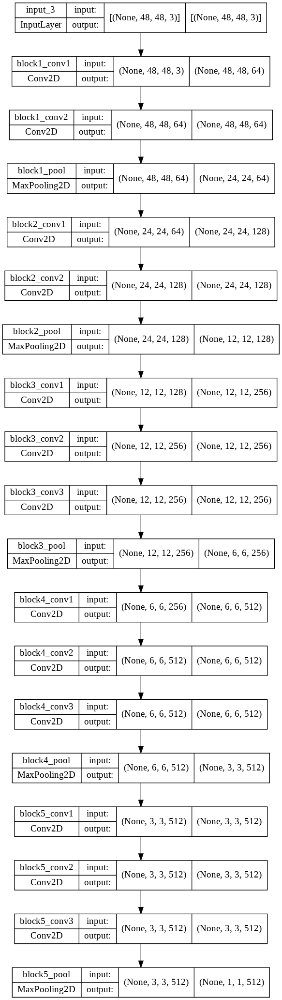

In [ ]:
tf.keras.utils.plot_model(preTrainedModelVgg16, show_shapes=True)

#<h1>Build  Fine Tuning Layers

##<h1>DenseNet169 Model

In [ ]:
#DenseNet169 Model

x=Flatten()(preTrainedModelDenseNet169.output)

#Fully Connection Layers
# FC1
x = Dense(1024, activation="relu")(x)
#Dropout to avoid overfitting effect
x = Dropout(0.4)(x)
# FC2
x = Dense(1024, activation="relu")(x)
# FC3
x = Dense(1024, activation="relu")(x)
#Dropout to avoid overfitting effect
x=Dropout(0.2)(x)
# FC4
x=Dense(512, activation="relu")(x)
# FC5
x=Dense(512, activation="relu")(x)
#Dropout to avoid overfitting effect
x=Dropout(0.2)(x)
# FC6
x=Dense(256, activation="relu")(x)
# FC7
x=Dense(256, activation="relu")(x)
#Dropout to avoid overfitting effect
x=Dropout(0.2)(x)
# FC8
x=Dense(128, activation="relu")(x)
#output layer
x=Dense(10,activation="softmax")(x)

In [ ]:
#concatenation layers
modelDenseNet169 = Model(preTrainedModelDenseNet169.input,x)
modelDenseNet169.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 48, 48, 3)]  0           []                               
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 54, 54, 3)   0           ['input_1[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (None, 24, 24, 64)   9408        ['zero_padding2d[0][0]']         
                                                                                                  
 conv1/bn (BatchNormalization)  (None, 24, 24, 64)   256         ['conv1/conv[0][0]']             
                                                                                              

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.486453 to fit



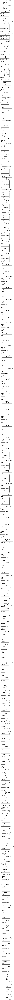

In [ ]:
tf.keras.utils.plot_model(modelDenseNet169, show_shapes=True)

<h1> 

##<h1>ResNet152V2 Model

In [ ]:
#ResNet152V2 Model

x=Flatten()(preTrainedModelResNet152V2.output)

#Fully Connection Layers
# FC1
x=Dense(1024, activation="relu")(x)
# FC2
x=Dense(1024, activation="relu")(x)
# FC3
x=Dense(1024, activation="relu")(x)
# FC4
x=Dense(1024, activation="relu")(x)
# #Dropout to avoid overfitting effect
x=Dropout(0.2)(x)
# FC5
x=Dense(512, activation="relu")(x)
# FC6
x=Dense(512, activation="relu")(x)
# FC7
x=Dense(256, activation="relu")(x)
# FC8
x=Dense(256, activation="relu")(x)
# #Dropout to avoid overfitting effect
x=Dropout(0.2)(x)
#output layer
x=Dense(10,activation="softmax")(x)


In [ ]:
#concatenation layers
modelResNet152V2=Model(preTrainedModelResNet152V2.input,x)
modelResNet152V2.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 48, 48, 3)]  0           []                               
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 54, 54, 3)    0           ['input_2[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 24, 24, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 pool1_pad (ZeroPadding2D)      (None, 26, 26, 64)   0           ['conv1_conv[0][0]']             
                                                                                            

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.520673 to fit



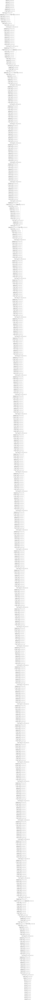

In [ ]:
tf.keras.utils.plot_model(modelResNet152V2, show_shapes=True)

##<h1>Vgg16 Model

In [ ]:
#Vgg16 Model
x=Flatten()(preTrainedModelVgg16.output)

#Fully Connection Layer
# FC1
x=Dense(1024, activation="relu")(x)
# FC2
x=Dense(1024, activation="relu")(x)
# FC3
x=Dense(1024, activation="relu")(x)
#Dropout to avoid overfitting effect
x=Dropout(0.5)(x)
# FC4
x=Dense(512, activation="relu")(x)
# FC5
x=Dense(512, activation="relu")(x)
#Dropout to avoid overfitting effect
x=Dropout(0.4)(x)
# FC6
x=Dense(256, activation="relu")(x)
# FC7
x=Dense(64, activation="relu")(x)
# FC8
x=Dense(64, activation="relu")(x)
#Dropout to avoid overfitting effect
x=Dropout(0.2)(x)
#output layer
x=Dense(10,activation="softmax")(x)

In [ ]:
#concatenation layers
modelVgg16=Model(preTrainedModelVgg16.input,x)
modelVgg16.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 48, 48, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (None, 48, 48, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 48, 48, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 24, 24, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 24, 24, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 24, 24, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 12, 12, 128)       0   

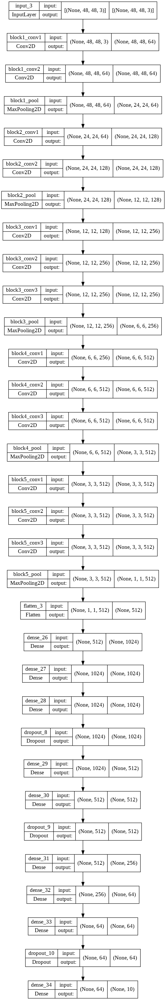

In [ ]:
tf.keras.utils.plot_model(modelVgg16, show_shapes=True)

##<h1>Compile Models

In [ ]:
#RMSPorp Optimization
optRMSProp=tf.keras.optimizers.RMSprop(
    learning_rate=0.0001,
    momentum=0.0001,
    epsilon=1e-07,
    name="RMSprop",
)

In [ ]:
#compile DenseNet169 Model
modelDenseNet169.compile(optimizer = "adam", loss="categorical_crossentropy",metrics=['accuracy'])

In [ ]:
#compile ResNet152V2 Model
modelResNet152V2.compile(optimizer = "adam", loss="categorical_crossentropy",metrics=['accuracy'])

In [ ]:
#compile Vgg16 Model
modelVgg16.compile(optimizer=optRMSProp, loss="categorical_crossentropy",metrics=['accuracy'])

##Virtualization Method

In [ ]:
def results_virt(history):

  # generate a figure containing 3 plots displayed horizontally
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(25,7))
  fig.suptitle('Model Results')
  
  #first plot
  # first we display the training accuracy in red color VS. the validation accuracy in blue color through the epochs
  ax1.plot(history.history['accuracy'], 'r')
  ax1.plot(history.history['val_accuracy'], 'b')
  ax1.set_title('model accuracy')
  ax1.set_ylabel('accuracy')
  ax1.set_xlabel('epochs')
  ax1.legend(['tr_price_acc', 'val_price_acc'])
  ax1.grid()

  #second plot
  # on this axis, we plot the training loss in red color VS. the validation loss in blue color through the epochs
  ax2.plot(history.history['loss'], 'r')
  ax2.plot(history.history['val_loss'], 'b')
  ax2.set_title('model loss')
  ax2.set_ylabel('loss')
  ax2.set_xlabel('epoch')
  ax2.legend(['tr_loss', 'val_loss'])
  ax2.grid()

# display the figure
  plt.show() 

##<h1>Fit Models

In [ ]:
#Hyperparameters 
Epochs=30
BatchSize=700

In [ ]:
#fit MobileNetV2 Model
historyResNet152V2Model=modelResNet152V2.fit(train_X,train_label,validation_data=(valid_X,valid_label) ,
                                             epochs=Epochs ,
                                             batch_size =BatchSize ,
                                             callbacks=tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience = 2),
                                             verbose=1)

Epoch 1/30
82/82 [==============================] - 145s 1s/step - loss: 0.7796 - accuracy: 0.7367 - val_loss: 2.0544 - val_accuracy: 0.8167
Epoch 2/30
82/82 [==============================] - 101s 1s/step - loss: 0.2702 - accuracy: 0.9058 - val_loss: 0.3239 - val_accuracy: 0.9017
Epoch 3/30
82/82 [==============================] - 103s 1s/step - loss: 0.2214 - accuracy: 0.9224 - val_loss: 0.3181 - val_accuracy: 0.9070
Epoch 4/30
82/82 [==============================] - 101s 1s/step - loss: 0.1849 - accuracy: 0.9341 - val_loss: 0.3536 - val_accuracy: 0.8983
Epoch 5/30
82/82 [==============================] - 102s 1s/step - loss: 0.1517 - accuracy: 0.9478 - val_loss: 0.2785 - val_accuracy: 0.9197
Epoch 6/30
82/82 [==============================] - 101s 1s/step - loss: 0.1328 - accuracy: 0.9551 - val_loss: 0.3351 - val_accuracy: 0.9123
Epoch 7/30
82/82 [==============================] - 101s 1s/step - loss: 0.1129 - accuracy: 0.9619 - val_loss: 0.3922 - val_accuracy: 0.9110


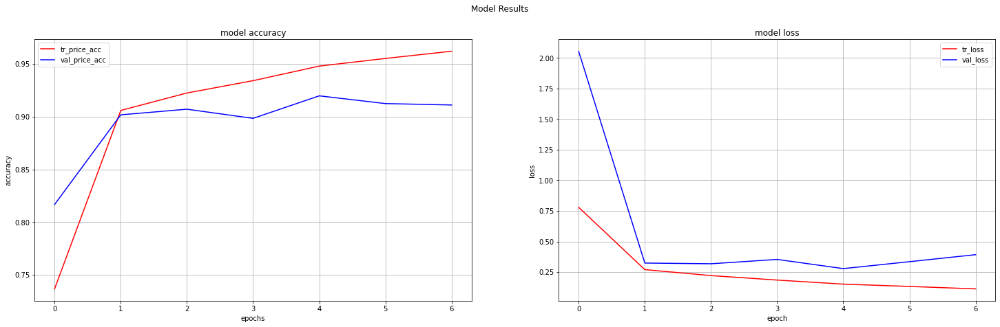

In [ ]:
results_virt(historyResNet152V2Model)

In [ ]:
#fit Vgg16 Model
historyVgg16Model=modelVgg16.fit(train_X,train_label,validation_data=(valid_X,valid_label) ,
                                 epochs=Epochs ,
                                 batch_size =BatchSize ,
                                 callbacks=tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience = 2),
                                 verbose=1)

Epoch 1/30
82/82 [==============================] - 62s 644ms/step - loss: 1.2685 - accuracy: 0.5431 - val_loss: 0.5422 - val_accuracy: 0.8200
Epoch 2/30
82/82 [==============================] - 47s 568ms/step - loss: 0.5750 - accuracy: 0.8174 - val_loss: 0.4587 - val_accuracy: 0.8297
Epoch 3/30
82/82 [==============================] - 47s 568ms/step - loss: 0.4561 - accuracy: 0.8535 - val_loss: 0.3742 - val_accuracy: 0.8717
Epoch 4/30
82/82 [==============================] - 46s 567ms/step - loss: 0.3946 - accuracy: 0.8698 - val_loss: 0.3456 - val_accuracy: 0.8813
Epoch 5/30
82/82 [==============================] - 46s 566ms/step - loss: 0.3539 - accuracy: 0.8826 - val_loss: 0.3235 - val_accuracy: 0.8907
Epoch 6/30
82/82 [==============================] - 47s 568ms/step - loss: 0.3260 - accuracy: 0.8923 - val_loss: 0.3312 - val_accuracy: 0.8787
Epoch 7/30
82/82 [==============================] - 47s 568ms/step - loss: 0.3025 - accuracy: 0.8991 - val_loss: 0.3170 - val_accuracy: 0.8930

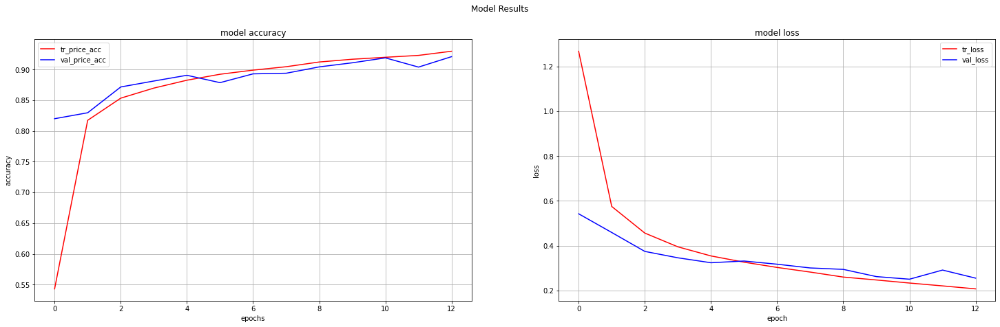

In [ ]:
results_virt(historyVgg16Model)

In [ ]:
#fit DenseNet169 Model
historyDenseNet169Model=modelDenseNet169.fit(train_X,train_label,validation_data=(valid_X,valid_label),
                                             epochs=Epochs,
                                             batch_size = BatchSize, 
                                             callbacks=tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience = 2),
                                             verbose=1)

Epoch 1/30
82/82 [==============================] - 63s 776ms/step - loss: 0.5718 - accuracy: 0.7971 - val_loss: 0.5886 - val_accuracy: 0.8233
Epoch 2/30
82/82 [==============================] - 46s 563ms/step - loss: 0.2679 - accuracy: 0.9103 - val_loss: 0.3634 - val_accuracy: 0.8913
Epoch 3/30
82/82 [==============================] - 46s 561ms/step - loss: 0.2276 - accuracy: 0.9235 - val_loss: 0.2566 - val_accuracy: 0.9163
Epoch 4/30
82/82 [==============================] - 46s 561ms/step - loss: 0.1992 - accuracy: 0.9317 - val_loss: 0.2817 - val_accuracy: 0.9200
Epoch 5/30
82/82 [==============================] - 46s 561ms/step - loss: 0.1788 - accuracy: 0.9390 - val_loss: 0.2402 - val_accuracy: 0.9243
Epoch 6/30
82/82 [==============================] - 46s 560ms/step - loss: 0.1586 - accuracy: 0.9459 - val_loss: 0.2757 - val_accuracy: 0.9207
Epoch 7/30
82/82 [==============================] - 46s 561ms/step - loss: 0.1454 - accuracy: 0.9513 - val_loss: 0.2778 - val_accuracy: 0.9150

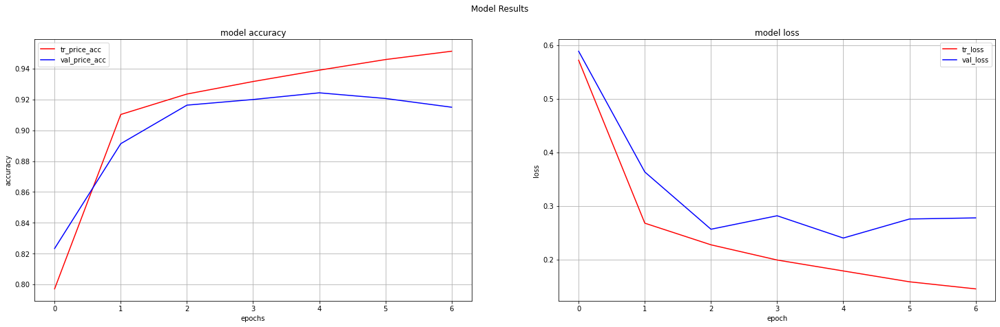

In [ ]:
results_virt(historyDenseNet169Model)

In [ ]:
#Save ResNet50 Model
modelDenseNet169.save("WeightsForDanseNet196.h5")
print("Done for DenseNet169")
#Save ResNet152V2 Model
modelResNet152V2.save("WeightsForResNet152V2.h5")
print("Done for ResNet152V2")
#Save Vgg16 Model
modelVgg16.save("WeightsForVgg16.h5")
print("Done for Vgg16")


Done for DenseNet169
Done for ResNet152V2
Done for Vgg16


#<h1> Do Testing on all Models

##<h1>  Evaluate Models

In [ ]:
#Evaluate DenseNet169 Model
print("Evaluate DenseNet169  Model")
modelDenseNet169.evaluate(test_X,test_Y_one_hot)

Evaluate DenseNet169  Model
313/313 [==============================] - 29s 87ms/step - loss: 0.2855 - accuracy: 0.9227


[0.2854560613632202, 0.9226999878883362]

In [ ]:
#Evaluate ResNet152V2 Model
print("Evaluate ResNet152V2 Model")
modelResNet152V2.evaluate(test_X,test_Y_one_hot)

Evaluate ResNet152V2 Model
313/313 [==============================] - 42s 131ms/step - loss: 0.3292 - accuracy: 0.9167


[0.32915395498275757, 0.916700005531311]

In [ ]:
#Evaluate Vgg16 Model
print("Evaluate Vgg16 Model")
modelVgg16.evaluate(test_X,test_Y_one_hot)

Evaluate Vgg16 Model
313/313 [==============================] - 14s 41ms/step - loss: 0.2370 - accuracy: 0.9192


[0.23695909976959229, 0.9192000031471252]

##<h1>  Predict Models

In [ ]:
#predict DenseNet169 Model
PredmodelDenseNet169=modelDenseNet169.predict(test_X)

#predict ResNet152V2 Model
PredmodelResNet152V2=modelResNet152V2.predict(test_X)

#predict Vgg16 Model
PredmodelVgg16= modelVgg16.predict(test_X)

In [ ]:
#Process on Prediction values for DenseNet169 Model
PredmodelDenseNet169= np.argmax(PredmodelDenseNet169,axis=1)
print("Prediction values for DenseNet169 Model :\n",PredmodelDenseNet169)

#Process on Prediction values for MobileNetV2 Model
PredmodelResNet152V2= np.argmax(PredmodelResNet152V2,axis=1)
print("\nPrediction values for ResNet152V2 Model :\n",PredmodelResNet152V2)

#Process on Prediction values for Vgg16 Model
PredmodelVgg16= np.argmax(PredmodelVgg16,axis=1)
print("\nPrediction values for Vgg16 Model :\n",PredmodelVgg16)

Prediction values for DenseNet169 Model :
 [0 1 2 ... 8 8 1]

Prediction values for ResNet152V2 Model :
 [0 1 2 ... 8 8 1]

Prediction values for Vgg16 Model :
 [0 1 2 ... 8 8 1]


##<h1> Evaluate Predication with Grund Truth for DensnNet169

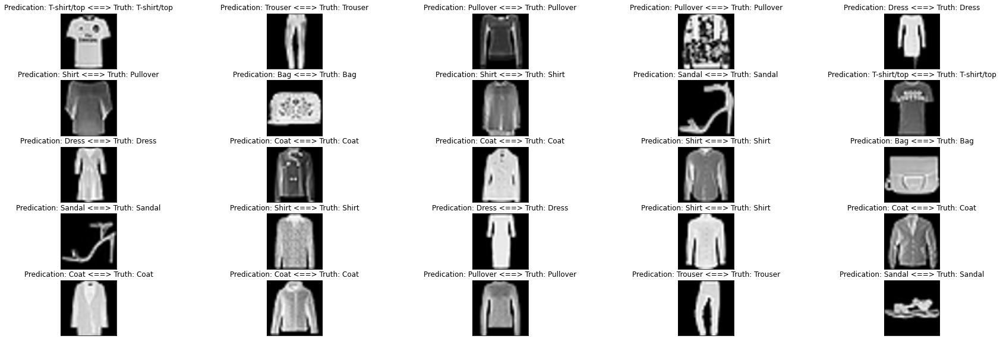

In [ ]:
#DenseNet169 model
plt.figure(figsize=(30,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.title(f"Predication: {class_names[PredmodelDenseNet169[i]]} <==> Truth: {class_names[test_Y[i]]}")
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])    
    plt.imshow(test_X[i])
plt.show()

##<h1> Evaluate Predication with Grund Truth for ResNet152 V2

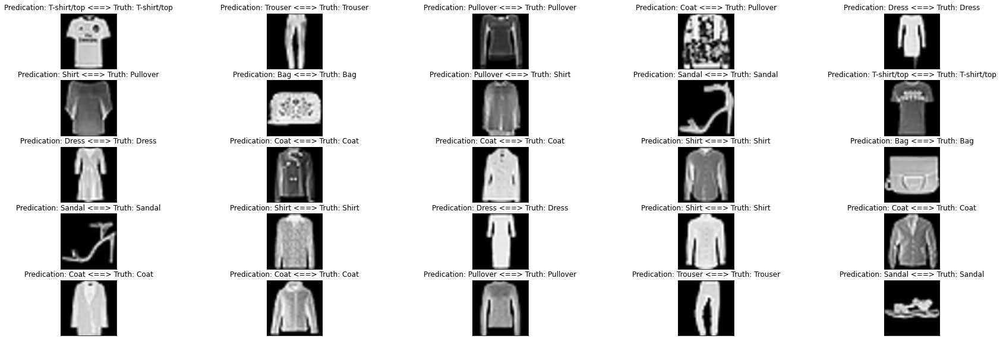

In [ ]:
#ResNet152V2 model
plt.figure(figsize=(30,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.title(f"Predication: {class_names[PredmodelResNet152V2[i]]} <==> Truth: {class_names[test_Y[i]]}")
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])    
    plt.imshow(test_X[i])
plt.show()

##<h1> Evaluate Predication with Grund Truth for Vgg16

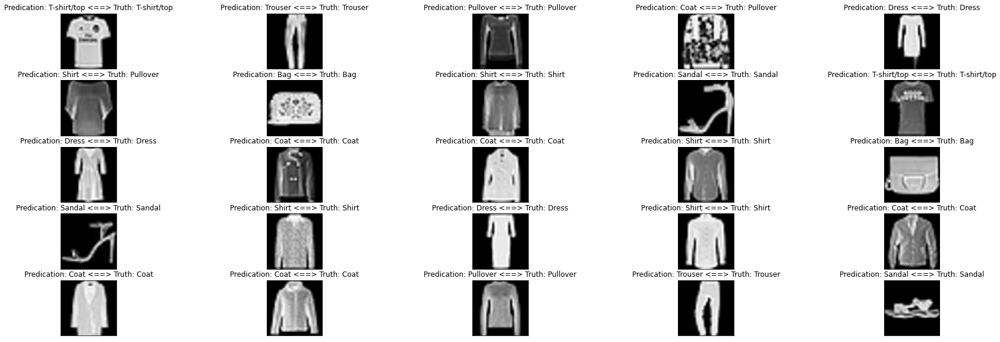

In [ ]:
#Vgg16 model
plt.figure(figsize=(30,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.title(f"Predication: {class_names[PredmodelVgg16[i]]} <==> Truth: {class_names[test_Y[i]]}")
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])    
    plt.imshow(test_X[i])
plt.show()

##<h1>confusion matrix to check on accuracy 

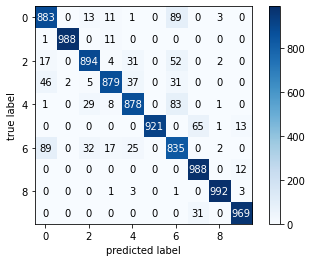

In [ ]:
#confusion matrix  for DenseNet169 Model
from mlxtend.plotting import plot_confusion_matrix

from sklearn.metrics import confusion_matrix
cm=confusion_matrix(test_Y,PredmodelDenseNet169)
# print(cm)
#Visualizing confusion matrix
fig, ax = plot_confusion_matrix(conf_mat=cm,
                                colorbar=True)
plt.show()

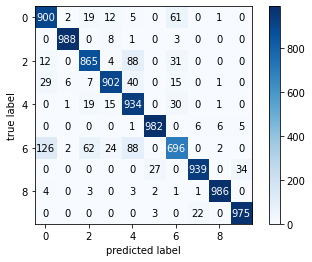

In [ ]:
#confusion matrix  for ResNet152V2 Model
from sklearn.metrics import confusion_matrix
cm=confusion_matrix(test_Y,PredmodelResNet152V2)
# print(cm)
#Visualizing confusion matrix
fig, ax = plot_confusion_matrix(conf_mat=cm,
                                colorbar=True)
plt.show()

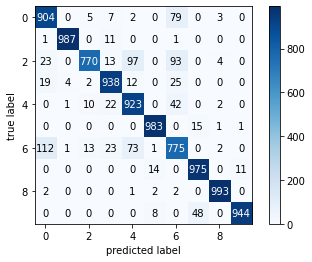

In [ ]:
#confusion matrix  for Vgg16 Model
from sklearn.metrics import confusion_matrix
cm=confusion_matrix(test_Y,PredmodelVgg16)
# print(cm)
#Visualizing confusion matrix
fig, ax = plot_confusion_matrix(conf_mat=cm,
                                colorbar=True)
plt.show()

##<h1>Classification Report

In [ ]:
#Classification Report for DenseNet169 Model
from sklearn.metrics import classification_report
ClassificationReport = classification_report(test_Y,PredmodelDenseNet169)
print('Classification Report for DenseNet169 Model is : \n ', ClassificationReport )

Classification Report for DenseNet169 Model is : 
                precision    recall  f1-score   support

           0       0.85      0.88      0.87      1000
           1       1.00      0.99      0.99      1000
           2       0.92      0.89      0.91      1000
           3       0.94      0.88      0.91      1000
           4       0.90      0.88      0.89      1000
           5       1.00      0.92      0.96      1000
           6       0.77      0.83      0.80      1000
           7       0.91      0.99      0.95      1000
           8       0.99      0.99      0.99      1000
           9       0.97      0.97      0.97      1000

    accuracy                           0.92     10000
   macro avg       0.93      0.92      0.92     10000
weighted avg       0.93      0.92      0.92     10000



In [ ]:
#Classification Report for ResNet152V2 Model
from sklearn.metrics import classification_report
ClassificationReport = classification_report(test_Y,PredmodelResNet152V2)
print('Classification Report for ResNet152V2 Model is : \n ', ClassificationReport )

Classification Report for ResNet152V2 Model is : 
                precision    recall  f1-score   support

           0       0.84      0.90      0.87      1000
           1       0.99      0.99      0.99      1000
           2       0.89      0.86      0.88      1000
           3       0.93      0.90      0.92      1000
           4       0.81      0.93      0.86      1000
           5       0.97      0.98      0.98      1000
           6       0.83      0.70      0.76      1000
           7       0.97      0.94      0.95      1000
           8       0.99      0.99      0.99      1000
           9       0.96      0.97      0.97      1000

    accuracy                           0.92     10000
   macro avg       0.92      0.92      0.92     10000
weighted avg       0.92      0.92      0.92     10000



In [ ]:
#Classification Report for Vgg16 Model
from sklearn.metrics import classification_report
ClassificationReport = classification_report(test_Y,PredmodelVgg16)
print('Classification Report for Vgg16 Model is : \n ', ClassificationReport )

Classification Report for Vgg16 Model is : 
                precision    recall  f1-score   support

           0       0.85      0.90      0.88      1000
           1       0.99      0.99      0.99      1000
           2       0.96      0.77      0.86      1000
           3       0.93      0.94      0.93      1000
           4       0.83      0.92      0.88      1000
           5       0.98      0.98      0.98      1000
           6       0.76      0.78      0.77      1000
           7       0.94      0.97      0.96      1000
           8       0.99      0.99      0.99      1000
           9       0.99      0.94      0.97      1000

    accuracy                           0.92     10000
   macro avg       0.92      0.92      0.92     10000
weighted avg       0.92      0.92      0.92     10000

